In [2]:
import matplotlib.pyplot as plt
import numpy as np
import os
import tensorflow as tf
import cv2
import yaml
from test_environment import TestEnvironment
from PIL import Image

### PROCESS MRL EYE DATASET

In [79]:
from PIL import Image
import cv2
def obtain_samples_from_dir(dataset_path) -> dict:
    images = []
    for filename in os.listdir(dataset_path):
        file = os.path.join(dataset_path, filename)
        if os.path.isdir(file):
            images = images + obtain_samples_from_dir(file)
        elif os.path.isfile(file) and filename[-4:] == ".png":
            label = filename.split("_")[4]
            images.append((file, label))
    
    return images

In [80]:
dataset_path = "../mrlEyes_2018_01/"
data = obtain_samples_from_dir(dataset_path)

### PROCESS CEW DATASET

In [83]:
import metrics_obtention as mo
import numpy as np
CEW_path = "images/dataset_B_FacialImages/"
def prepare_CEW_dataset(config):
    labels = []
    images = []
    filenames = []
    open_eyes_dir = os.path.join(CEW_path, "Open")
    for filename in os.listdir(open_eyes_dir):
        file = os.path.join(open_eyes_dir, filename)
        if os.path.isfile(file) and ".jpg" in filename:
            image = cv2.imread(file)
            _, _, roi_images = mo.process_frame(image, config)
            if roi_images is not None:
                image = roi_images["left_eye"]
                images.append(image)
                labels.append(True)
                filenames.append(file)

    closed_eyes_dir = os.path.join(CEW_path, "Closed")
    for filename in os.listdir(closed_eyes_dir):
        file = os.path.join(closed_eyes_dir, filename)
        if os.path.isfile(file) and ".jpg" in filename:
            image = cv2.imread(file)
            _, _, roi_images = mo.process_frame(image, config)
            if roi_images is not None:
                image = roi_images["left_eye"]
                images.append(image)
                labels.append(False)
                filenames.append(file)
    
    return images, labels, filenames

In [4]:
test_environment = TestEnvironment()
with open("config.yaml", "r") as f:
    config = yaml.load(f, Loader=yaml.loader.FullLoader)

In [5]:
images, labels, filenames = prepare_CEW_dataset(config["metric_obtention"])

didnt find face
didnt find face
didnt find face
didnt find face
didnt find face
didnt find face
didnt find face
didnt find face
didnt find face
didnt find face
didnt find face
didnt find face
didnt find face
didnt find face
didnt find face
didnt find face
didnt find face
didnt find face
didnt find face
didnt find face
didnt find face
didnt find face
didnt find face
didnt find face
didnt find face
didnt find face


In [ ]:
data = list(zip(images, labels))

In [11]:
BATCH_SIZE = 2
IMG_SIZE = (160, 160)
IMG_SHAPE = IMG_SIZE + (3,)

In [81]:
def parse_function(filename, label):
    image_string = tf.io.read_file(filename)
    image_decoded = tf.image.decode_png(image_string, channels=3)
    image = tf.cast(image_decoded, tf.float32)
    image = tf.image.resize(image, IMG_SIZE)
    return image, label

In [84]:
import random
random.seed(42)
data_length = len(data)
# print(data_length)
shuffled_data = random.sample(data, data_length)
filenames = [ x[0] for x in shuffled_data ]
labels = [ int(x[1]) for x in shuffled_data ]

train_len = int(0.6 * data_length)
valid_len = int(0.2 * data_length)
test_len = int(0.2 * data_length)

print(train_len)
print(valid_len)
print(test_len)

train_filenames = filenames[:train_len]
train_images = images[:train_len]
train_labels = labels[:train_len]
train_dataset = tf.data.Dataset.from_tensor_slices((train_filenames, train_labels))
# train_dataset = train_dataset.batch(BATCH_SIZE)
train_dataset = train_dataset.map(parse_function).batch(BATCH_SIZE)

valid_filenames = filenames[train_len:train_len+valid_len]
valid_images = images[train_len:train_len+valid_len]
valid_labels = labels[train_len:train_len+valid_len]
valid_dataset = tf.data.Dataset.from_tensor_slices((valid_filenames, valid_labels))
# valid_dataset = valid_dataset.batch(BATCH_SIZE)
valid_dataset = valid_dataset.map(parse_function).batch(BATCH_SIZE)

test_filenames = filenames[-test_len:]
test_images = images[-test_len:]
test_labels = labels[-test_len:]
test_dataset = tf.data.Dataset.from_tensor_slices((test_filenames, test_labels))
# test_dataset = test_dataset.batch(BATCH_SIZE)
test_dataset = test_dataset.map(parse_function).batch(BATCH_SIZE)

print(len(train_dataset))
print(len(valid_dataset))
print(len(test_dataset))

for dat_images, dat_labels in valid_dataset.take(3):
    print(dat_images.shape)
    print(dat_labels)

list(test_dataset.as_numpy_iterator())

50938
16979
16979
25469
8490
8490
(2, 160, 160, 3)
tf.Tensor([1 0], shape=(2,), dtype=int32)
(2, 160, 160, 3)
tf.Tensor([1 0], shape=(2,), dtype=int32)
(2, 160, 160, 3)
tf.Tensor([1 1], shape=(2,), dtype=int32)


[(array([[[[139.     , 139.     , 139.     ],
           [139.     , 139.     , 139.     ],
           [139.     , 139.     , 139.     ],
           ...,
           [143.     , 143.     , 143.     ],
           [143.     , 143.     , 143.     ],
           [143.     , 143.     , 143.     ]],
  
          [[139.     , 139.     , 139.     ],
           [139.     , 139.     , 139.     ],
           [139.     , 139.     , 139.     ],
           ...,
           [142.71016, 142.71016, 142.71016],
           [143.     , 143.     , 143.     ],
           [143.     , 143.     , 143.     ]],
  
          [[139.     , 139.     , 139.     ],
           [139.     , 139.     , 139.     ],
           [139.     , 139.     , 139.     ],
           ...,
           [142.3164 , 142.3164 , 142.3164 ],
           [142.71016, 142.71016, 142.71016],
           [143.     , 143.     , 143.     ]],
  
          ...,
  
          [[114.     , 114.     , 114.     ],
           [114.     , 114.     , 114.     ],
  

In [85]:
for dat_images, dat_labels in test_dataset.take(3):
    print(dat_images)
    print(dat_labels)

list(test_dataset.as_numpy_iterator())

tf.Tensor(
[[[[139.      139.      139.     ]
   [139.      139.      139.     ]
   [139.      139.      139.     ]
   ...
   [143.      143.      143.     ]
   [143.      143.      143.     ]
   [143.      143.      143.     ]]

  [[139.      139.      139.     ]
   [139.      139.      139.     ]
   [139.      139.      139.     ]
   ...
   [142.71016 142.71016 142.71016]
   [143.      143.      143.     ]
   [143.      143.      143.     ]]

  [[139.      139.      139.     ]
   [139.      139.      139.     ]
   [139.      139.      139.     ]
   ...
   [142.3164  142.3164  142.3164 ]
   [142.71016 142.71016 142.71016]
   [143.      143.      143.     ]]

  ...

  [[114.      114.      114.     ]
   [114.      114.      114.     ]
   [114.      114.      114.     ]
   ...
   [137.      137.      137.     ]
   [137.      137.      137.     ]
   [137.      137.      137.     ]]

  [[114.      114.      114.     ]
   [114.      114.      114.     ]
   [114.      114.      114.     ]
 

[(array([[[[139.     , 139.     , 139.     ],
           [139.     , 139.     , 139.     ],
           [139.     , 139.     , 139.     ],
           ...,
           [143.     , 143.     , 143.     ],
           [143.     , 143.     , 143.     ],
           [143.     , 143.     , 143.     ]],
  
          [[139.     , 139.     , 139.     ],
           [139.     , 139.     , 139.     ],
           [139.     , 139.     , 139.     ],
           ...,
           [142.71016, 142.71016, 142.71016],
           [143.     , 143.     , 143.     ],
           [143.     , 143.     , 143.     ]],
  
          [[139.     , 139.     , 139.     ],
           [139.     , 139.     , 139.     ],
           [139.     , 139.     , 139.     ],
           ...,
           [142.3164 , 142.3164 , 142.3164 ],
           [142.71016, 142.71016, 142.71016],
           [143.     , 143.     , 143.     ]],
  
          ...,
  
          [[114.     , 114.     , 114.     ],
           [114.     , 114.     , 114.     ],
  

### PROCESS OPEN_CLOSE EYE DATASET

In [56]:
train_dir = "images/open_closed_dataset/train/"
test_dir = "images/open_closed_dataset/test/"
train_dataset = tf.keras.utils.image_dataset_from_directory(train_dir,
                                                            shuffle=True,
                                                            batch_size=BATCH_SIZE,
                                                            image_size=IMG_SIZE)
test_dataset = tf.keras.utils.image_dataset_from_directory(test_dir,
                                                            shuffle=True,
                                                            batch_size=BATCH_SIZE,
                                                            image_size=IMG_SIZE)                                             

Found 1234 files belonging to 2 classes.
Found 218 files belonging to 2 classes.


In [86]:
preprocess_input = tf.keras.applications.mobilenet_v2.preprocess_input

In [87]:
base_model = tf.keras.applications.MobileNetV2(input_shape=IMG_SHAPE,
                                               include_top=False,
                                               weights='imagenet')

In [88]:
base_model.trainable = False
base_model.summary()

Model: "mobilenetv2_1.00_160"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_5 (InputLayer)           [(None, 160, 160, 3  0           []                               
                                )]                                                                
                                                                                                  
 Conv1 (Conv2D)                 (None, 80, 80, 32)   864         ['input_5[0][0]']                
                                                                                                  
 bn_Conv1 (BatchNormalization)  (None, 80, 80, 32)   128         ['Conv1[0][0]']                  
                                                                                                  
 Conv1_relu (ReLU)              (None, 80, 80, 32)   0           ['bn_Conv1[0][

In [89]:
global_average_layer = tf.keras.layers.GlobalAveragePooling2D()
prediction_layer = tf.keras.layers.Dense(1)

In [90]:
inputs = tf.keras.Input(shape=(160, 160, 3))
x = preprocess_input(inputs)
x = base_model(x, training=False)
x = global_average_layer(x)
x = tf.keras.layers.Dropout(0.2)(x)
outputs = prediction_layer(x)
model = tf.keras.Model(inputs, outputs)

In [91]:
base_learning_rate = 0.0001
model.compile(optimizer=tf.keras.optimizers.Adam(learning_rate=base_learning_rate),
              loss=tf.keras.losses.BinaryCrossentropy(from_logits=True),
              metrics=['accuracy'])
model.summary()

Model: "model_2"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_6 (InputLayer)        [(None, 160, 160, 3)]     0         
                                                                 
 tf.math.truediv_3 (TFOpLamb  (None, 160, 160, 3)      0         
 da)                                                             
                                                                 
 tf.math.subtract_3 (TFOpLam  (None, 160, 160, 3)      0         
 bda)                                                            
                                                                 
 mobilenetv2_1.00_160 (Funct  (None, 5, 5, 1280)       2257984   
 ional)                                                          
                                                                 
 global_average_pooling2d_2   (None, 1280)             0         
 (GlobalAveragePooling2D)                                  

In [95]:
initial_epochs = 10

loss0, accuracy0 = model.evaluate(valid_dataset)

 394/8490 [>.............................] - ETA: 3:44 - loss: 0.0931 - accuracy: 0.9657

KeyboardInterrupt: 

In [93]:
print("initial loss: {:.2f}".format(loss0))
print("initial accuracy: {:.2f}".format(accuracy0))

initial loss: 0.99
initial accuracy: 0.49


In [94]:
history = model.fit(train_dataset,
                    epochs=initial_epochs,
                    validation_data=valid_dataset)

Epoch 1/10
25469/25469 [==============================] - 968s 38ms/step - loss: 0.1512 - accuracy: 0.9373 - val_loss: 0.0969 - val_accuracy: 0.9592
Epoch 2/10
   99/25469 [..............................] - ETA: 12:59 - loss: 0.1029 - accuracy: 0.9495

KeyboardInterrupt: 

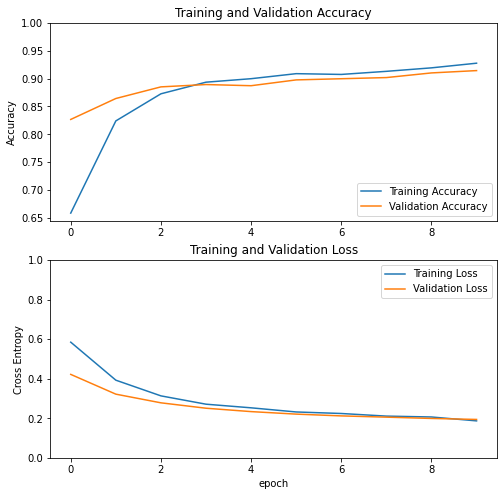

In [96]:
acc = history.history['accuracy']
val_acc = history.history['val_accuracy']

loss = history.history['loss']
val_loss = history.history['val_loss']

plt.figure(figsize=(8, 8))
plt.subplot(2, 1, 1)
plt.plot(acc, label='Training Accuracy')
plt.plot(val_acc, label='Validation Accuracy')
plt.legend(loc='lower right')
plt.ylabel('Accuracy')
plt.ylim([min(plt.ylim()),1])
plt.title('Training and Validation Accuracy')

plt.subplot(2, 1, 2)
plt.plot(loss, label='Training Loss')
plt.plot(val_loss, label='Validation Loss')
plt.legend(loc='upper right')
plt.ylabel('Cross Entropy')
plt.ylim([0,1.0])
plt.title('Training and Validation Loss')
plt.xlabel('epoch')
plt.show()

In [97]:
loss, accuracy = model.evaluate(test_dataset)
print('Test accuracy :', accuracy)

1112/8490 [==>...........................] - ETA: 3:26 - loss: 0.1075 - accuracy: 0.9573

KeyboardInterrupt: 

In [98]:
for filename in ["eye.jpg"]:
    image_string = tf.io.read_file(filename)
    image_decoded = tf.image.decode_png(image_string, channels=3)
    image = tf.cast(image_decoded, tf.float32)
    image = tf.image.resize(image, IMG_SIZE)
    image = tf.reshape(image, [1, 160, 160, 3])
    image_batch, label_batch = test_dataset.as_numpy_iterator().next()

    predictions = model.predict_on_batch(image_batch).flatten()
    predictions = model.predict(image)

    predictions = tf.nn.sigmoid(predictions)
    print('Predictions_logit:\n', predictions.numpy())
    predictions = tf.where(predictions < 0.5, 0, 1)

    print('Predictions:\n', predictions.numpy())


Predictions_logit:
 [[0.95663905]]
Predictions:
 [[1]]


In [54]:
# Retrieve a batch of images from the test set
for image_batch, label_batch in test_dataset.take(300):
  predictions = model.predict_on_batch(image_batch).flatten()

  # Apply a sigmoid since our model returns logits
  predictions = tf.nn.sigmoid(predictions)
  print('Predictions:\n', predictions.numpy())
  predictions = tf.where(predictions < 0.5, 0, 1)

  print('Predictions:\n', predictions.numpy())
  print('Labels:\n', label_batch)



Predictions:
 [0.01292616 0.54393655]
Predictions:
 [0 1]
Labels:
 tf.Tensor([False False], shape=(2,), dtype=bool)
Predictions:
 [0.02001074 0.00200653]
Predictions:
 [0 0]
Labels:
 tf.Tensor([False False], shape=(2,), dtype=bool)
Predictions:
 [0.05695859 0.00417969]
Predictions:
 [0 0]
Labels:
 tf.Tensor([False False], shape=(2,), dtype=bool)
Predictions:
 [0.05891541 0.03071335]
Predictions:
 [0 0]
Labels:
 tf.Tensor([False False], shape=(2,), dtype=bool)
Predictions:
 [0.08015305 0.31646055]
Predictions:
 [0 0]
Labels:
 tf.Tensor([False False], shape=(2,), dtype=bool)
Predictions:
 [0.03763995 0.00066411]
Predictions:
 [0 0]
Labels:
 tf.Tensor([False False], shape=(2,), dtype=bool)
Predictions:
 [0.06085369 0.01899052]
Predictions:
 [0 0]
Labels:
 tf.Tensor([False False], shape=(2,), dtype=bool)
Predictions:
 [1.7541533e-05 9.6524060e-02]
Predictions:
 [0 0]
Labels:
 tf.Tensor([False False], shape=(2,), dtype=bool)
Predictions:
 [0.07568631 0.02589005]
Predictions:
 [0 0]
Labels:


In [99]:
!mkdir saved_model4
model.save('saved_model4/my_model_OC')


INFO:tensorflow:Assets written to: saved_model4/my_model_OC\assets


In [3]:
model = tf.keras.models.load_model('saved_model/my_model')
model.summary()

Model: "model_1"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_4 (InputLayer)        [(None, 160, 160, 3)]     0         
                                                                 
 mobilenetv2_1.00_160 (Funct  (None, 5, 5, 1280)       2257984   
 ional)                                                          
                                                                 
 global_average_pooling2d_1   (None, 1280)             0         
 (GlobalAveragePooling2D)                                        
                                                                 
 dropout_1 (Dropout)         (None, 1280)              0         
                                                                 
 dense_1 (Dense)             (None, 1)                 1281      
                                                                 
Total params: 2,259,265
Trainable params: 1,281
Non-trainab

In [5]:
images, labels, filenames = prepare_CEW_dataset()

TypeError: process_frame() missing 1 required positional argument: 'config'

In [17]:
def test_open_close_eye_detection(model):
    images, labels, filenames = prepare_CEW_dataset()

    predictions_dict = {}
    performance_metrics_dict = {}

    predictions = []
    ind = 0
    for image in images:
        prediction = model.predict(image)[0][0]
        prediction = tf.nn.sigmoid(prediction)
        prediction = tf.where(prediction < 0.5, 0, 1)
        if prediction is not None:
            predictions.append(prediction)
        else:
            predictions.append(None)
        
        ind += 1

    performance_metrics, failed_predictions = compute_predictions_quality(predictions, labels, true_val=1)
    predictions_dict["CEW"] = predictions
    performance_metrics_dict["CEW"] = performance_metrics

    return { "predictions": predictions_dict, "performance_metrics": performance_metrics_dict }

In [18]:
def compute_predictions_quality(predictions, labels, true_val=True) -> dict:
    # TODO: compute accuracy, sensitivity, ...
    performance_metrics = {}   
    
    failed_predictions = []

    num_frames = len(predictions)
    num_hits = 0
    num_true_positives = 0
    num_true_negatives = 0
    num_false_positives = 0
    num_false_negatives = 0
    for i in range(0, num_frames):
        if predictions[i] == labels[i]:
            num_hits += 1
            if labels[i] == true_val:
                num_true_positives += 1
            else:
                num_true_negatives += 1
        else:
            if labels[i] == true_val:
                num_false_negatives += 1
            else:
                num_false_positives += 1
            failed_predictions.append(i)

    performance_metrics["accuracy"] = num_hits / num_frames

    if (num_true_positives + num_false_positives) != 0:
        performance_metrics["precision"] = num_true_positives / (num_true_positives + num_false_positives)
    else:
        performance_metrics["precision"] = None

    if (num_true_positives + num_false_negatives) != 0:
        performance_metrics["recall"] = num_true_positives / (num_true_positives + num_false_negatives)
    else:
        performance_metrics["recall"] = None
    return performance_metrics, failed_predictions

In [19]:
test_open_close_eye_detection(model)

(91.28320217132568, 106.51407837867737)
15.0
27
(40, 59, 76, 46)
6
17
4.0
5
(36.0, 54, 81, 50.0)
(91.28320217132568, 106.51407837867737)
15.0
27
(35, 19, 36, 41)
6
17
4.0
5
(31.0, 14, 41, 45.0)
(81.7568451166153, 88.55356574058533)
12.0
24
(38, 59, 75, 44)
6
16
3.0
4
(35.0, 55, 79, 47.0)
(81.7568451166153, 88.55356574058533)
12.0
24
(36, 25, 41, 41)
5
16
3.0
4
(33.0, 21, 45, 44.0)
(68.88076961040497, 84.24970805644989)
12.0
20
(39, 59, 73, 42)
3
14
4.0
3
(35.0, 56, 76, 46.0)
(68.88076961040497, 84.24970805644989)
12.0
20
(39, 29, 42, 43)
4
13
4.0
3
(35.0, 26, 45, 47.0)
(83.15775394439697, 91.64029359817505)
13.0
24
(40, 60, 76, 45)
5
16
4.0
4
(36.0, 56, 80, 49.0)
(83.15775394439697, 91.64029359817505)
13.0
24
(38, 24, 39, 43)
5
15
4.0
4
(34.0, 20, 43, 47.0)
(77.90789306163788, 94.44376826286316)
13.0
23
(32, 58, 71, 38)
6
13
3.0
5
(29.0, 53, 76, 41.0)
(77.90789306163788, 94.44376826286316)
13.0
23
(34, 24, 40, 41)
7
16
3.0
3
(31.0, 21, 43, 44.0)
(85.56305766105652, 103.14483642578125)


{'predictions': {'CEW': [<tf.Tensor: shape=(), dtype=int32, numpy=0>,
   <tf.Tensor: shape=(), dtype=int32, numpy=1>,
   <tf.Tensor: shape=(), dtype=int32, numpy=0>,
   <tf.Tensor: shape=(), dtype=int32, numpy=1>,
   <tf.Tensor: shape=(), dtype=int32, numpy=1>,
   <tf.Tensor: shape=(), dtype=int32, numpy=1>,
   <tf.Tensor: shape=(), dtype=int32, numpy=1>,
   <tf.Tensor: shape=(), dtype=int32, numpy=0>,
   <tf.Tensor: shape=(), dtype=int32, numpy=1>,
   <tf.Tensor: shape=(), dtype=int32, numpy=0>,
   <tf.Tensor: shape=(), dtype=int32, numpy=0>,
   <tf.Tensor: shape=(), dtype=int32, numpy=1>,
   <tf.Tensor: shape=(), dtype=int32, numpy=1>,
   <tf.Tensor: shape=(), dtype=int32, numpy=1>,
   <tf.Tensor: shape=(), dtype=int32, numpy=1>,
   <tf.Tensor: shape=(), dtype=int32, numpy=0>,
   <tf.Tensor: shape=(), dtype=int32, numpy=0>,
   <tf.Tensor: shape=(), dtype=int32, numpy=1>,
   <tf.Tensor: shape=(), dtype=int32, numpy=1>,
   <tf.Tensor: shape=(), dtype=int32, numpy=0>,
   <tf.Tensor: sha